<a href="https://colab.research.google.com/github/thual/POM-ch7-dispersionOndes/blob/main/dispersionOndes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dispersion des ondes

Activité : changez les paramètres des animations paquets d'onde!

On considère la superposition de $N$ ondes progressives monochromatique suivante:
$$ \theta(x,t) = A \sum_{n=1}^N G(k_n) \cos[k_n x - \Omega(k_n) t] \;,$$
avec $\color{cyan}{k_n} = \color{red}{k_1} + (n-1) \delta k$ avec $\delta k = {\color{green}{k_N} - \color{red}{k_1}\over N}$. On note $k_0 = {\color{red}{k_1}+\color{green}{k_N}\over 2}$ le milieu de l'intervalle $[\color{red}{k_1}, \color{green}{k_N}]$. 

## Spectre d'ampitude

On considère le spectre d'amplitude suivant :
$$ G(k) = \exp\left[ {(k-k0)^2 \over 2 \,\delta k^2}\right]\;.$$

## Relation de dispersion 

On considère la relation de dispersion de l'équation de Klein-Gordon ${\partial ^2 \theta\over \partial t^2} = -\omega_*^2 \theta + c^2 {\partial^2 \theta \over \partial x^2}$, qui s'écrit :
$$ \Omega(k) = \sqrt{ \omega_*^2 + c^2 k^2}\;,$$
où $\omega_*$ et $c$ sont des constantes. 

Ces paquets d'ondes sont visualisées ici pour plusieurs valeurs de $N$. 


# Tracé de la relation de dispersion 

*   Pulsation $\Omega(k)$ (en noir)
*   Vitesse de phase $c_p(k) = \Omega(k)/k$ (en bleu)
*   Vitesse de groupe $c_g(k) = \Omega'(k)$ (en rouge)
*   Amplitude  $G(k)$ (en noir)

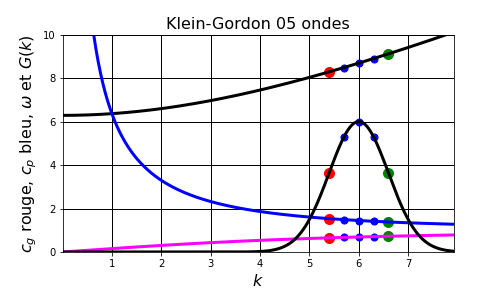

# Animation d'un paquet de cinq ondes
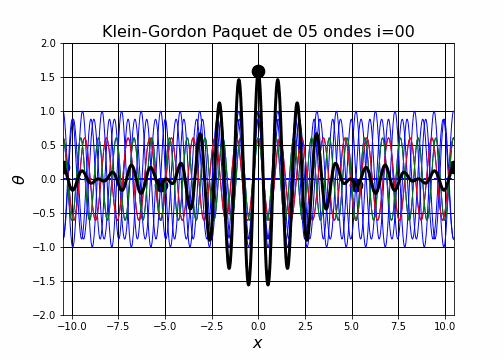

# Première partie du programme

Exécutez tout d'abord cette première partie du programme pour mettre en place les librairies et le sous-programme ! 
*   Colab : ⌘/Ctrl+F9 pour tout exécuter.
*   MyBinder : -> Run -> "Run all cells"


In [25]:
# import libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

print("Dispersion des ondes")

 # Petits outils

def zfi(x,le=2):
    miss=le-len(str(x))
    a='0'*miss+str(x)
    return a


def signalN(x,t):
    psi=np.zeros((N,Nx))
    for n in range(0,N):
        kn=k[n]; omn=om[n]; 
        psin=np.cos(kn*x-omn*t)*gauss(kn);
        psi[n,:]=psin;
    return psi

# Relation de dispersion et spectre d'amplitude


def reladi(k):
    # Relation de dispersion Klein Gordon : omega^2=oms^2+c^2*k^2
    omega=np.sqrt(oms**2+(c*k)**2)
    return omega

def vgroup(k):
    # Vitesse de groupe Klein Gordeon : vg=c^2/omega
    omega=reladi(k)
    vg=c**2*k/omega
    return vg

def gauss(k):
    g=np.exp(-(k-k0)**2/(2*var))
    return g

# Tracé des relations de dispersion et spectre d'amplitude

def reladisp(name,kmin,kmax):
    kplt=np.linspace(0.01,kmax,501);
    omplt=reladi(kplt); cgplt=vgroup(kplt); cpplt=omplt/kplt;
    plt.figure(2,figsize=(7,4))
    plt.xlabel('$k$',fontsize=16 )
    plt.ylabel('$c_g$ rouge, $c_p$ bleu et $\omega$',fontsize=16)
    plt.xlim(kmin,kmax)
    plt.ylim(0,10)
    titlefig=name
    plt.title(titlefig,fontsize=16)
    plt.grid(color='black', axis='y', linestyle='-', linewidth=1)        
    plt.grid(color='black', axis='x', linestyle='-', linewidth=1)        
    plt.plot(kplt,omplt,color='black',linewidth=3)
    plt.plot(kplt,cgplt,color='magenta',linewidth=3)
    plt.plot(kplt,cpplt,color='blue',linewidth=3)
    plt.plot([0,kmax],[1,1],color='black',linestyle='-.',linewidth=3)
    plt.savefig(name)
    plt.show()


def plotrelaN(name,kmin,kmax,k):
    # Tracé de cg, cp,  omega et amplitudes G(k)
    kplt=np.linspace(0.01,kmax,501);
    om=reladi(k); cg=vgroup(k); cp=om/k;
    omplt=reladi(kplt); cgplt=vgroup(kplt); cpplt=omplt/kplt;
    plt.figure(2,figsize=(7,4))
    plt.xlabel(r'$k$',fontsize=16 )
    plt.ylabel('$c_g$ rouge, $c_p$ bleu, $\omega$ et $G(k)$',fontsize=16)
    plt.xlim(kmin,kmax)
    plt.ylim(0,10)
    titlefig=name
    plt.title(titlefig,fontsize=16)
    plt.grid(color='black', axis='y', linestyle='-', linewidth=1)        
    plt.grid(color='black', axis='x', linestyle='-', linewidth=1)        
    plt.plot(kplt,omplt,color='black',linewidth=3)
    plt.plot(kplt,cgplt,color='magenta',linewidth=3)
    plt.plot(kplt,cpplt,color='blue',linewidth=3)
    plt.plot(kplt,fac*gauss(kplt),color='black',linewidth=3)
    # modes 
    plt.scatter(k,fac*amp,marker='o',color='blue',s=50)
    plt.scatter(k,om,marker='o',color='blue',s=50)
    plt.scatter(k,cg,marker='o',color='blue',s=50)
    plt.scatter(k,cp,marker='o',color='blue',s=50)
    # extremes
    plt.scatter(k1,fac*gauss(k1),marker='o',color='red',s=100)
    plt.scatter(k1,reladi(k1),marker='o',color='red',s=100)
    plt.scatter(k1,vgroup(k1),marker='o',color='red',s=100)
    plt.scatter(k1,reladi(k1)/k1,marker='o',color='red',s=100)
    plt.scatter(kN,fac*gauss(kN),marker='o',color='green',s=100)
    plt.scatter(kN,reladi(kN),marker='o',color='green',s=100)
    plt.scatter(kN,vgroup(kN),marker='o',color='green',s=100)
    plt.scatter(kN,reladi(kN)/kN,marker='o',color='green',s=100)
    plt.savefig(name)
    plt.show()
     
 
 # Animations d'ondes
 # ================================================

def AniPaquetOndes(): 
    # Animation du paquet d'ondes
    global fig, ax
    global name
    global k, amp, om, cg, cp

    k=np.linspace(k1,kN,N) # Axe des nombresd'ondes
    amp=gauss(k) # Spectre des amplitudes des ondes
    om=reladi(k) # Pulsations données par la relation de dispersion
    cg=vgroup(k) # Vitesses de groupe
    cp=om/k # Vitesses de phase

    # Tracé avec amplitude
    nomrela="Klein-Gordon "+zfi(N)+" ondes"
    kmin=.01; kmax=1.2*kN
    plotrelaN(nomrela,kmin,kmax,k)
    
    # Tracé zoom avec amplitude  
    nomzoom="Klein-Gordon "+zfi(N)+" ondes Zoom"
    kmin=.9*k1; kmax=1.1*kN
    plotrelaN(nomzoom,kmin,kmax,k)
    

    # Preparation de la figure pour l'animation
    fig=plt.figure(1,figsize=(7,5))
    ax=plt.subplot(1,1,1)
    name="Klein-Gordon Paquet de "+zfi(N)+" ondes"
    print(" ")   
    print("==================================")
    print(name)
    
    ani=Gifanim(anisimple)      
    return ani

# Fonction d'animations appelées par FuncAnimation
# ================================================

def anisimple(i):
    # Animation simple
    global fig, ax
    global k, amp, om, cg, cp
    
    # Signal
    t=dt*i;
    psi=signalN(x,t)
    xp=np.zeros(M); psip=np.zeros(M)
    for m in range(M):
        xp[m]=(2-m)*L0+v*t; psip[m]=0;    
    psi1=np.cos(k1*x-om1*t)*gauss(k1)
    psiN=np.cos(kN*x-omN*t)*gauss(kN)
    
    ax.scatter(xp,2*psip,marker='o',color='red',s=160)
    
    # Figure 
    ax.clear()
    title=name+" i="+zfi(i)
    ax.set_xlabel(r'$x$',fontsize=16 )
    ax.set_ylabel(r'$\theta$',fontsize=16)
    ax.set_title(title,fontsize=16)
    ax.set_xlim(-L,L)
    ax.set_ylim(ymin,ymax)
    ax.grid(color='black', axis='y', linestyle='-', linewidth=1)        
    ax.grid(color='black', axis='x', linestyle='-', linewidth=1)
    ax.plot([-L,L],[0,0],'b--',linewidth=2)
    
    # Superposition des N ondes
    psitot=x*0; 
    for n in range(N):
        psin=psi[n,:]
        psitot=psitot+psin/N
        for m in range(M):
            psip[m]=psip[m]+np.cos(k[n]*xp[m]-om[n]*t)*gauss(k[n])/N
        ax.plot(x,psin,color='blue',linewidth=1)
        
    # Tracés 
    ax.plot(x,psi1,color='red',linewidth=1)
    ax.plot(x,psiN,color='green',linewidth=1)
    ax.plot(x,2*psitot,color='black',linewidth=3)
    ax.scatter(xp,2*psip,marker='o',color='black',s=160)
    # Sauver toutes les figures
    if FlagSavext: 
        namei=name+zfi(i)+ext;
        fig.savefig(namei)
           


# Fonction Gifanim
# ================

def Gifanim(anifunc):
    global inter, fram
    ani=FuncAnimation(fig,anifunc,frames=fram,interval=inter,repeat=True)
    namegif=name+".gif"
    print(" ")   
    print("Simulation pour créer un gif animé")  
    ani.save(namegif,writer="pillow")
    print("   Gif animé créé :",namegif)
    # Visualisation animée de la simulation 
    print("Simulation pour visualiser l'animation")
    print("==================================")
    plt.close() 
    plt.rc('animation', html='jshtml')
    return ani

Dispersion des ondes


# Paramètres du programme

*(Colab : Cliquez sur le triangle à gauche de titre pour visualiser le code et changer les paramètres !)*

NB : les types d'ondes non activés sont lancés dans des lignes de commandes séparées, à la fin du programme.

**Paramètres principaux**
* `N` : Nombre d'ondes dans le paquet d'ondes (5)
* `k0` : Nombre d'onde central $k_0$(6)
* `de` : Pourcentage de $k_0$ pour l'intervalle $N \delta k$ (.1)
* `Nt` : Nombre d'images par les animations temporelles (40)

**Paramètres secondaires**
* `FlagSavext` : Sauver les  des fichiers
* `ext`: Extension des fichiers à sauver (.png, .pdf, .jpg, etc.)

**Types de tracé**
* `FlagTraceKleinGordon` : Tracé de la relation de dispersion de Klein-Gordon
* `FlagAniPaquetOndes` : Animation d'un paquet d'ondes

*Exécutez le code ci-dessous (Colab : cliquez sur "1 cellule masquée" pour changer les paramètres) !*

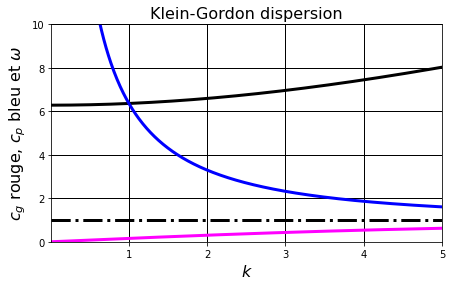

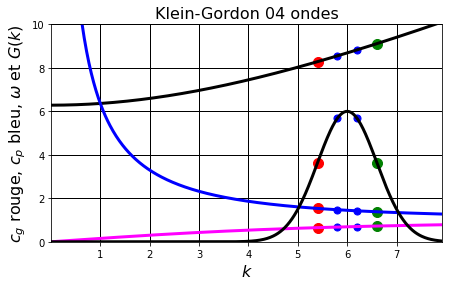

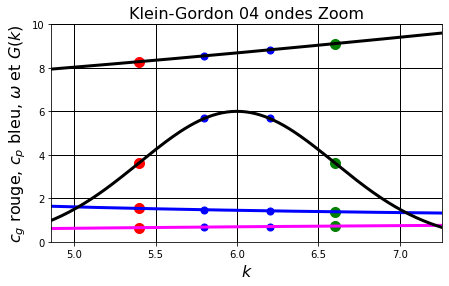

 
Klein-Gordon Paquet de 04 ondes
 
Simulation pour créer un gif animé
   Gif animé créé : Klein-Gordon Paquet de 04 ondes.gif
Simulation pour visualiser l'animation


In [26]:
F=False; T=True

# Tracés de la relation de dispersion Klein-Gordon
FlagTraceKleinGordon=T
 
# Choix de l'animation 
FlagAniPaquetOndes=T

# Paramètres principaux
N=4 # Nombre d'ondes progressives monochromatiques superposées
k0=6 # Nombre d'onde principal du paquet d'ondes
de=.10 # Pourcentage de k0 pour l'écart des nombres d'ondes
Nt=40 # Nombre d'images pour l'animation séparées de dt

# Paramètres pouvant être changés
fac=6; # Facteur de multiplication de l'amplitude pour son tracé
ymin=-2; ymax=2 # Bornes en y pour les tracés
ext=".png" # Extension des fichiers à sauver
FlagSavext=F # Création de fichier ext pour chaque image
 
# Paramètres qu'il n'est pas utile de changer
oms=2*np.pi # Puslation de référence de l'équation de Klein-Gordon
c=1 # vitesse de l'équation de Klein-Gordon
Nx=1001 # Nombre de points sur l'axe des x
inter=300; # millisecondes animation par défaut

# Paramètres dérivés 
fram=np.arange(0,Nt) # Tableau pour l'animation des images
dk=de*k0 # Increment nombre d'ondes extrêmes
k1=k0-dk; kN=k0+dk; # Nombres d'ondes extrêmes
var=dk**2; # Variance gaussienne du spectre d'amplitudes
L=2*np.pi/dk # Intervalle [-L, L] pour le tracé
L0=L/2 # Longeur de l'intervalle
x=np.linspace(-L,L,Nx)# Points sur l'axe des x

# Témoins et pas de temps
M=30*N # Nombre de temoins de phase
om0=reladi(k0); cp0=om0/k0; la0=2*np.pi/k0 # Onde porteuse
v=cp0 # Vitesse de phase moyenne
dt=.5*la0/cp0 # Pas de temps entre deux images
om1=reladi(k1); omN=reladi(kN) # Pulsation des nombres d'ondes k1 et kN

# Figures relation de dispersion
if FlagTraceKleinGordon: 
    # Tracé cg, cp et omega 
    kmin=.01; kmax=5
    reladisp("Klein-Gordon dispersion",kmin,kmax)
    
# Lancement de l'animation
ani="pas d'animation"   
if FlagAniPaquetOndes: ani=AniPaquetOndes()

# Animation 
# Cette commande doit rester la dernière pour être suivie d'effet
ani

# Animations supplémentaires

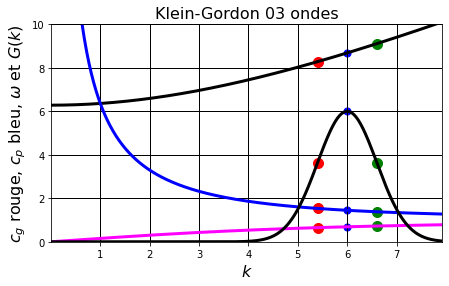

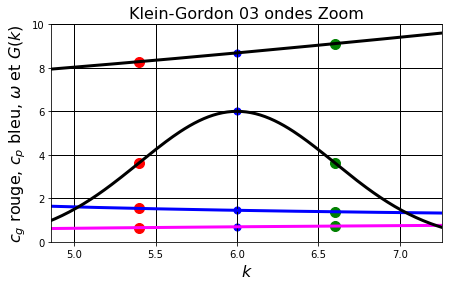

 
Klein-Gordon Paquet de 03 ondes
 
Simulation pour créer un gif animé
   Gif animé créé : Klein-Gordon Paquet de 03 ondes.gif
Simulation pour visualiser l'animation


In [27]:
#Paquet de trois ondes
N=3; AniPaquetOndes()

# Tracé de l'enveloppe d'un paquet d'onde

Om montre (voir l'exercice) que enveloppe d'un paquet de $N$ ondes est de la forme $F(X)=G_N(\delta k X)$ avec :
$$ G_N(Y) = {\sin Y \over N\, \sin(Y/N)}\;$$

Les tracés de $G_N$ pour plusieurs valeurs de $N$ montre que les paquets sont de plus en plus éloignés les uns des autres au fur et à mesure que $N$ augmente. Il n'y a plus qu'un paquet lors $N$ est infini.

*Le programme ci-dessous peut être executé indépendament des programmes précédents.*

N= 2


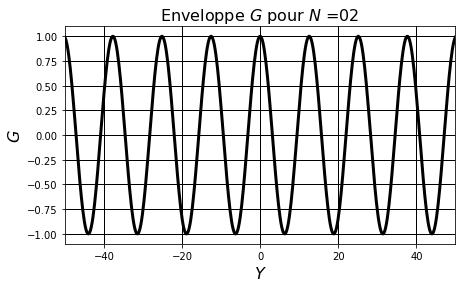

N= 3


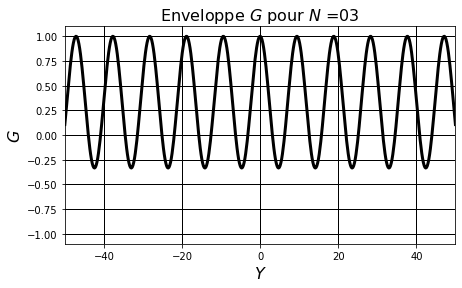

N= 4


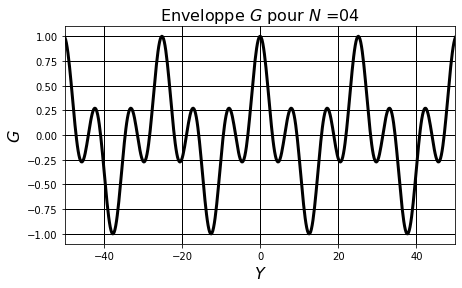

N= 5


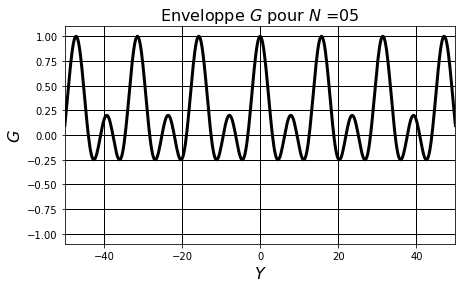

N= 6


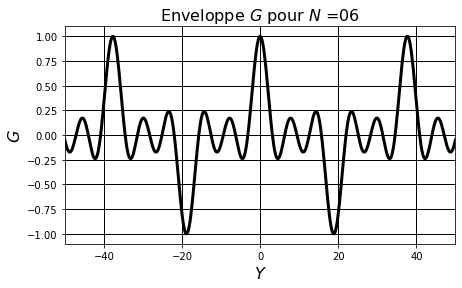

N= 7


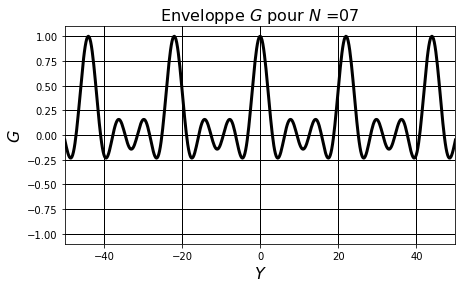

N= 8


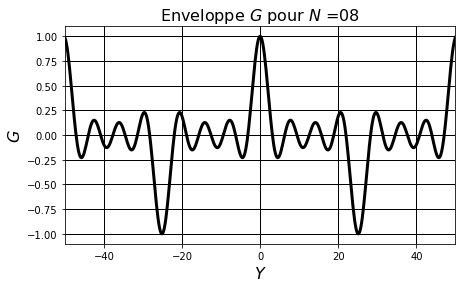

N= 9


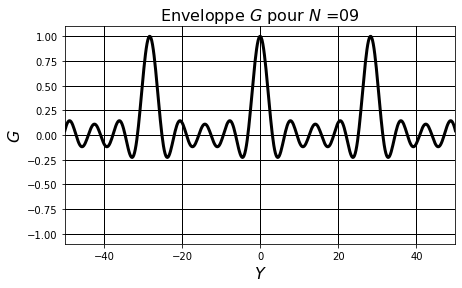

N= 10


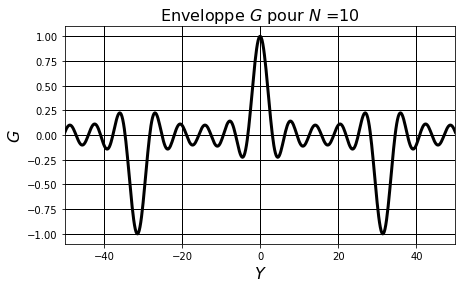

N= 11


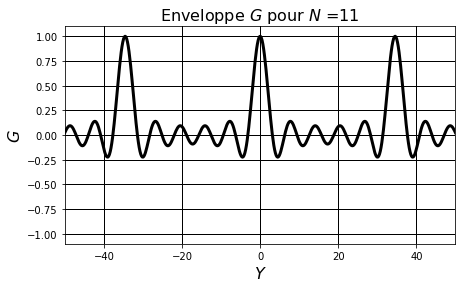

N= 12


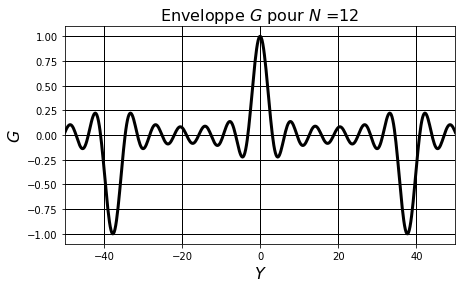

N= 13


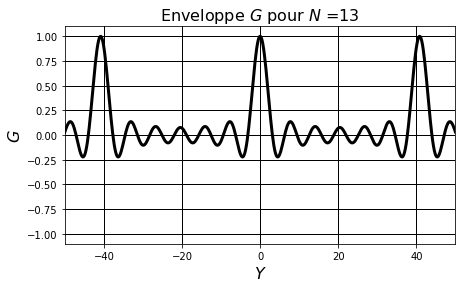

N= 14


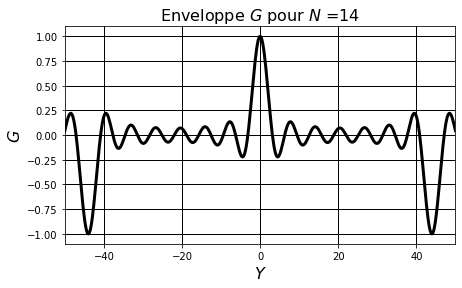

N= 15


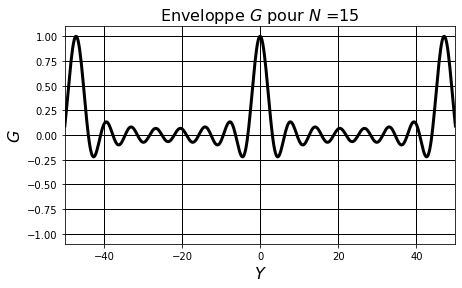

N= 16


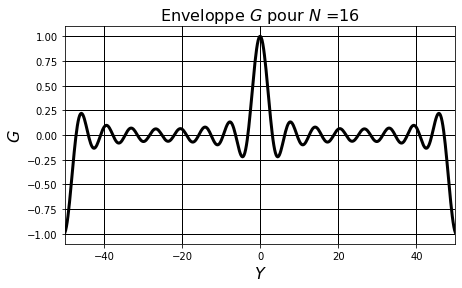

N= 17


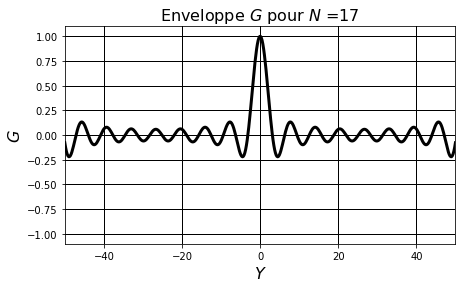

N= 18


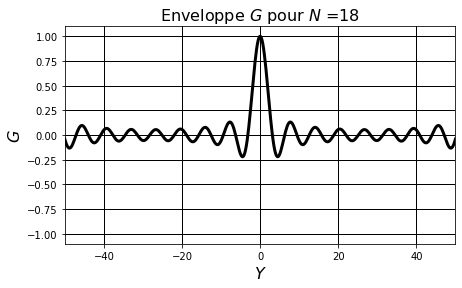

N= 19


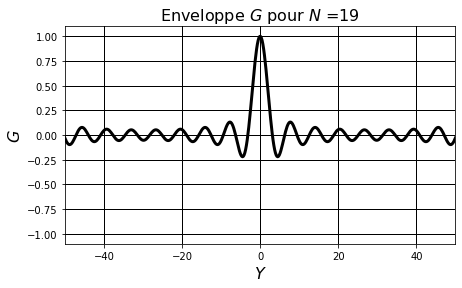

N= 20


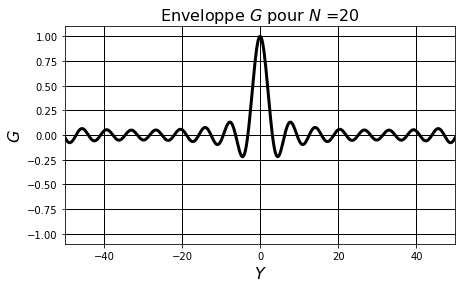

In [28]:
import numpy as np
import matplotlib.pyplot as plt
def zfi(x,le=2):
    miss=le-len(str(x))
    a='0'*miss+str(x)
    return a
xmax=50
Y=np.linspace(-xmax,xmax,500)
for N in range(2,21):  
  print("N=",N)
  fig=plt.figure(1,figsize=(7,4))
  plt.xlabel(r'$Y$',fontsize=16 )
  plt.ylabel(r'$G$',fontsize=16)
  plt.xlim(-xmax,xmax)
  plt.ylim(-1.1,1.1)
  titlefig="Enveloppe $G$ pour $N$ ="+zfi(N)
  plt.title(titlefig,fontsize=16)
  plt.grid(color='black', axis='y', linestyle='-', linewidth=1)        
  plt.grid(color='black', axis='x', linestyle='-', linewidth=1)  
  G=np.sin(Y)/(N*np.sin(Y/N))
  plt.plot(Y,G,color='black',linewidth=3)
  name="Enveloppe-N="+zfi(N)
  plt.savefig(name)
  plt.show()
  plt.close()